In [ ]:
import cv2
import numpy as np
from tqdm import tqdm
import os
import torch
from PIL import Image
import shutil
import random

# Detecção de Carros com Análise de Movimento

Desenvolver um modelo de detecção de carros utilizando um vídeo gravado em um cruzamento. O objetivo é explorar informações espaciais e temporais para aprimorar a detecção de veículos.

---

- Murilo Lima Lirani de Carvalho (11234673)
- Enzo Castelo Branco Biondi (14568142)
- Vinicio Yusuke Hayashibara (13642797)
- Julia Pravato (14615054)
- Marcos Paulo Rocha Baltazar (13782373)
- Laura Nannetti Moreira (12557504)

---

## Etapas do Processo

### 1. Leitura do Vídeo e Geração de Rótulos com Modelo Pré-Treinado

- Um vídeo de 80 minutos foi capturado em um cruzamento com tráfego de veículos.
- A leitura do vídeo é feita para extração de frames a intervalos definidos.
- Os frames extraídos ainda não possuem rótulos.
- Utiliza-se um modelo pré-treinado YOLOv5 para detectar veículos nesses frames individualmente.
- As bounding boxes geradas pelo modelo servem como rótulos automáticos.
- Os frames selecionados e seus respectivos labels são salvos como dataset para as próximas etapas.

---

### 2. Construção de um Novo Dataset

- Cada imagem do dataset terá um novo canal adicional:
  - Em vez de imagens RGB (3 canais), utilizaremos imagens com 4 canais.
  - O 4º canal será uma máscara indicando regiões com detecção de movimento no vídeo.
- Utiliza-se técnicas de data augmentation para aumentar a quantidade de imagens de treino.

---

### 3. Construção do 4º Canal (Mapa de Movimento)

1. Seleção de 5 minutos de vídeo para construir o background. (Pode ser refeito a cada hora na prática, por exemplo).
2. Para cada pixel, calcula-se a moda dos valores de todos os frames nesses 5 minutos.
   - A moda funciona bem pois a câmera é estática e o valor mais comum de um pixel representa o fundo (ex: asfalto).
   - Objetos em movimento, como carros, ocupam um pixel por curtos períodos, não afetando a moda.
3. Subtrai-se o background calculado de cada frame do vídeo.
4. Calcula-se a diferença absoluta entre cada frame e o background.
5. O resultado é uma máscara que serve como o 4º canal da imagem usada como entrada no modelo.

Esse canal adicional oferece ao modelo uma pista sobre onde há atividade recente.

---

### 4. Treinamento de Novo Modelo

- Um novo modelo será treinado a partir do dataset criado, utilizando:
  - As imagens com o canal extra de movimento.
  - As bounding boxes criadas pelo YOLOv5 como rótulos.
- A métrica utilizada para avaliação será baseada nas intersecções entre bounding boxes.

---

## Considerações Finais

- Criar um modelo mais sensível ao contexto temporal de maneira simples.
- Utilizar aprendizado fraco com base em predições de um modelo pré-treinado.
- Considerar adicionar o contexto temporal entre labels para tracking nos carros na segunda etapa, ou seja, considerar um RNN que compara os labels anteriores com os atuais, identificando cada carro durante o vídeo.
- Até agora foi utilizado apenas um vídeo, o que pode gerar grande viés no treinamento. Isso já foi considerado, vídeos de outros dias já foram gravados e salvos, para que seja possível avaliar o modelo de maneira mais justa.

---


## *ETAPA 1*

Ainda estamos testando como treinar o novo modelo, atualmente apenas com os 3 canais principais, ou seja, incorporar os dados temporais será feito na segunda etapa.

Já foi iniciada a geração do quarto canal, mas nem tudo será apresentado ainda.

---

## Relatório

Esse notebook contém todos os procedimentos utilizados para gerar os resultados encontrados. No entanto, como os processos foram divididos entre vários autores/computadores, estão apresentados apenas os modelos de criação, junto a imagens fixadas dos resultados como exemplos em 'markdown'.

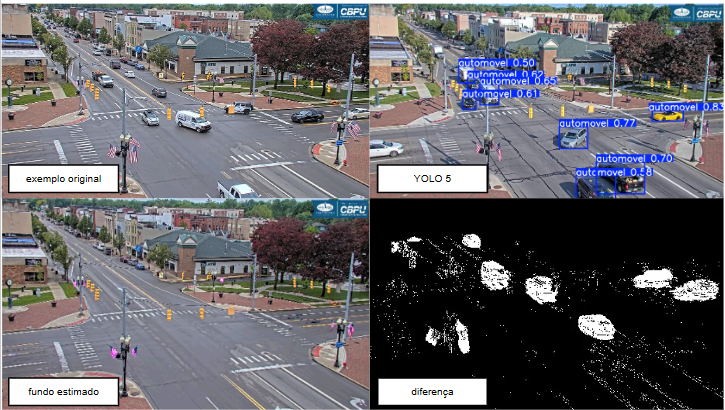

## Arquitetura

Iniciamos com um modelo pré-treinado yolo-v5 para servir de base para nosso treinamento. Esse modelo é bem grande e foi usado somente para rotular, não há tunning.

Como se trata de um problema complexo e com uma base de dados reduzida, consideramos treinar uma rede um pouco menor, mas pré-treinada também, principalmente pois as saídas da rede são as listas de reconhecimento.
Com essa rede, utilizaremos novas informações em busca de melhoria de desempenho, além de possibilitar, posteriormente, adicionar o contexto temporal para o tracking dos carros na etapa 2.

## Rotular com YOLO

### Pegando frames do vídeo

In [3]:
# Caminho do vídeo e pasta de saída
video_path = 'sample5.mp4'
output_folder = 'imagens_p_treino'

# Criar a pasta de saída caso não exista
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Abrir o vídeo
cap = cv2.VideoCapture(video_path)

# Taxa de quadros do vídeo 
fps = cap.get(cv2.CAP_PROP_FPS)
frame_interval = int(fps * 3)  # Capturar um frame a cada 3 segundos 

frame_number = 0
frame_index = 0  

while frame_number < 2:
    # Captura um frame do vídeo
    ret, frame = cap.read()

    # Se não houver mais frames, o vídeo terminou
    if not ret:
        break

    if frame_index % frame_interval == 0:
        # Salva o frame como imagem
        # frame_filename = os.path.join(output_folder, f'frame_{frame_number:04d}.jpg')
        # cv2.imwrite(frame_filename, frame)
        frame_number += 1

    # Atualiza o contador de frames
    frame_index += 1

# Libera o vídeo após a extração
cap.release()
print(f'Frames extraídos: {frame_number}')

Frames extraídos: 2


### Gerando os rótulos

Using cache found in C:\Users\Usuário/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2025-6-24 Python-3.13.1 torch-2.7.0+cpu CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
C:\Users\Usuário/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


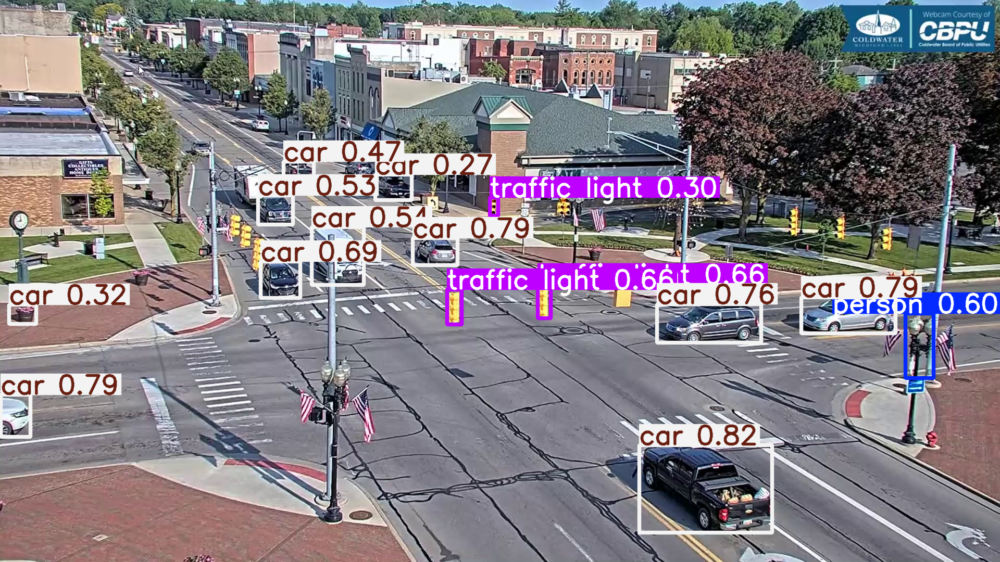

C:\Users\Usuário/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


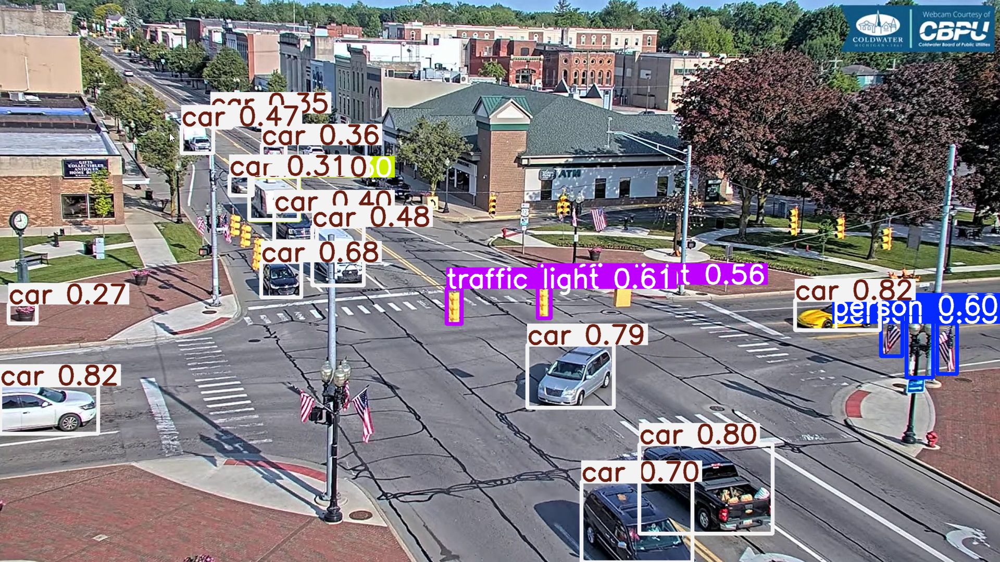

Processamento de detecção completo!


In [5]:
# Carregar o modelo YOLOv5 pré-treinado (usando a versão mais leve, yolov5s)
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')  # YOLOv5s é a versão mais rápida

# Caminho onde as imagens estão armazenadas
frames_folder = 'imagens_p_treino'  # Caminho para a pasta com os frames extraídos
counter = 0
# Iterar pelos frames extraídos e realizar a detecção
for frame_filename in os.listdir(frames_folder):
    if (frame_filename.endswith('.jpg')) and counter < 2 :  # Verificar se é uma imagem JPEG
        frame_path = os.path.join(frames_folder, frame_filename)
        counter = counter + 1

        # Carregar a imagem
        img = Image.open(frame_path)

        # Realizar a detecção no frame usando o modelo YOLOv5
        results = model(img)

        # Obter as caixas delimitadoras, os IDs das classes e a confiança
        detections = results.xywh[0]  # Detecções em coordenadas xywh (x_center, y_center, width, height)

        # Apenas para visualização (não salva os rótulos)
        for detection in detections:
            class_id = int(detection[5])  # ID da classe (0 para "carro")
            confidence = float(detection[4])  # Confiança da detecção
            x_center = float(detection[0])  # Centro da caixa
            y_center = float(detection[1])
            width = float(detection[2])
            height = float(detection[3])

        # Mostrar a imagem com as caixas delimitadoras (não salva, só exibe)
        results.show()

print("Processamento de detecção completo!")


### Arrumando os labels do modelo

In [6]:
print(model.names)
#Queremos apenas os automóveis, ou seja, labels 2, 3 e 7

{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell phone', 68: 'microw

In [ ]:
def unifica_labels():
  original_labels_folder = 'imagens_p_treino/labels' # Onde os labels originais estão (gerados pelo YOLOv5)
  unified_labels_folder = 'MeuProjetoCarros/unified_labels' # Nova pasta para os labels unificados

  os.makedirs(unified_labels_folder, exist_ok=True)

  # Definir os IDs das classes que queremos manter, conforme o modelo YOLOv5 no COCO
  # car=2, motorcycle=3, truck=7
  allowed_and_unify_classes_ids = {2, 3, 7}

  # O novo ID para todas essas classes será 0
  unified_class_id = 0

  for filename in os.listdir(original_labels_folder):
      if not filename.endswith('.txt'):
          continue

      input_filepath = os.path.join(original_labels_folder, filename)
      output_filepath = os.path.join(unified_labels_folder, filename)

      lines_to_write = []
      with open(input_filepath, 'r') as infile:
          for line in infile:
              parts = line.strip().split()
              if not parts: # Pular linhas vazias
                  continue

              class_id = int(parts[0])

              if class_id in allowed_and_unify_classes_ids:
                  # Altera o ID da classe para o ID unificado (0)
                  parts[0] = str(unified_class_id)
                  lines_to_write.append(" ".join(parts))

      # Só escreve no arquivo de saída se houver pelo menos uma detecção de veículo
      if lines_to_write:
          with open(output_filepath, 'w') as outfile:
              for line in lines_to_write:
                  outfile.write(line + '\n')
      else:
          pass

# unifica_labels()

## Construção de um novo dataset

### Fazendo Data Augmentation

In [ ]:
def apply_augmentation(num_augmentations_per_image=3):
    import albumentations as A
    # caminho das pastas de entrada e saida
    original_images_folder = 'imagens_p_treino'
    unified_labels_folder = 'MeuProjetoCarros/unified_labels'
    augmented_images_folder = 'MeuProjetoCarros/augmented_images'
    augmented_labels_folder = 'MyDrive/MeuProjetoCarros/augmented_labels'

    # cria as pastas de saida caso não existam
    os.makedirs(augmented_images_folder, exist_ok=True)
    os.makedirs(augmented_labels_folder, exist_ok=True)

    # Definir as transformações de augmentação usando Albumentations
    transform = A.Compose([
        A.HorizontalFlip(p=0.5),  # Flip horizontal aleatório
        A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.1, rotate_limit=15, p=0.5),  # Deslocamento, escala e rotação aleatória
        A.RandomBrightnessContrast(p=0.3),  # Ajuste aleatório de brilho e contraste
        A.RGBShift(r_shift_limit=10, g_shift_limit=10, b_shift_limit=10, p=0.3),  # Deslocamento aleatório nas cores RGB
        A.GaussNoise(p=0.2),  # Adiciona ruído gaussiano
        A.MotionBlur(p=0.2),  # Adiciona desfoque de movimento
        A.CoarseDropout(max_holes=8, max_height=8, max_width=8, p=0.2, fill_value=0),  # Substitui áreas aleatórias por 0 (preto)
    ], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))  # Especifica o formato da caixa de contorno (YOLO)


    # Lista de imagens da pasta de entrada
    image_files = [f for f in os.listdir(original_images_folder) if f.endswith(('.jpg', '.jpeg', '.png'))]

    # Loop sobre todas as imagens da pasta de entrada
    for img_filename in image_files:
        img_path = os.path.join(original_images_folder, img_filename)

        # Gerar o caminho para o arquivo de label correspondente
        label_filename = img_filename.replace('.jpg', '.txt').replace('.jpeg', '.txt').replace('.png', '.txt')
        label_path = os.path.join(unified_labels_folder, label_filename)

        # Carregar a imagem
        image = cv2.imread(img_path)
        if image is None:
            print(f"Aviso: Não foi possível carregar a imagem {img_path}. Pulando...")
            continue

        # Obter altura e largura da imagem para normalização das caixas
        h, w, _ = image.shape  # h = altura, w = largura
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Converte para RGB, pois o Albumentations usa essa ordem

        # Inicializa as listas para as caixas e rótulos das classes
        bboxes = []
        class_labels = []

        # Verificar se existe o arquivo de label
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                # Para cada linha do arquivo de rótulos
                for line in f:
                    parts = line.strip().split()
                    if len(parts) == 5:
                        # Processa as coordenadas das caixas de acordo com o formato YOLO
                        class_id = int(parts[0])  # ID da classe (0 para "automoveis")
                        x_center = float(parts[1]) / w  # Coordenada do centro, normalizada
                        y_center = float(parts[2]) / h  # Coordenada do centro, normalizada
                        width = float(parts[3]) / w  # Largura, normalizada
                        height = float(parts[4]) / h  # Altura, normalizada

                        # Adiciona a caixa e o rótulo às listas
                        bboxes.append([x_center, y_center, width, height])
                        class_labels.append(class_id)
                    else:
                        print(f"Aviso: Linha de label mal formatada em {label_path}: {line.strip()}")

        # Aplica as transformações de augmentação
        for i in range(num_augmentations_per_image):
            # Realiza a transformação na imagem, caixas e rótulos
            augmented = transform(image=image, bboxes=bboxes, class_labels=class_labels)
            aug_image = augmented['image']  # Imagem aumentada
            aug_bboxes = augmented['bboxes']  # Caixas aumentadas
            aug_class_labels = augmented['class_labels']  # Rótulos das classes aumentados

            # Salva a imagem aumentada
            aug_img_filename = f"{os.path.splitext(img_filename)[0]}_aug{i}.jpg"
            cv2.imwrite(os.path.join(augmented_images_folder, aug_img_filename), cv2.cvtColor(aug_image, cv2.COLOR_RGB2BGR))

            # Salva os rótulos aumentados
            aug_label_filename = f"{os.path.splitext(label_filename)[0]}_aug{i}.txt"

            # Se houverem boxes após a augmentação, salva os rótulos no formato YOLO
            if aug_bboxes:
                with open(os.path.join(augmented_labels_folder, aug_label_filename), 'w') as f:
                    for bbox, cls_label in zip(aug_bboxes, aug_class_labels):
                        if bbox[2] > 0 and bbox[3] > 0:  # Verifica se a caixa tem tamanho válido
                            f.write(f"{cls_label} {bbox[0]:.6f} {bbox[1]:.6f} {bbox[2]:.6f} {bbox[3]:.6f}\n")
            else:
                # Caso não haja caixas (apenas para casos de falha na augmentação), cria um arquivo vazio
                open(os.path.join(augmented_labels_folder, aug_label_filename), 'w').close()



# apply_augmentation()

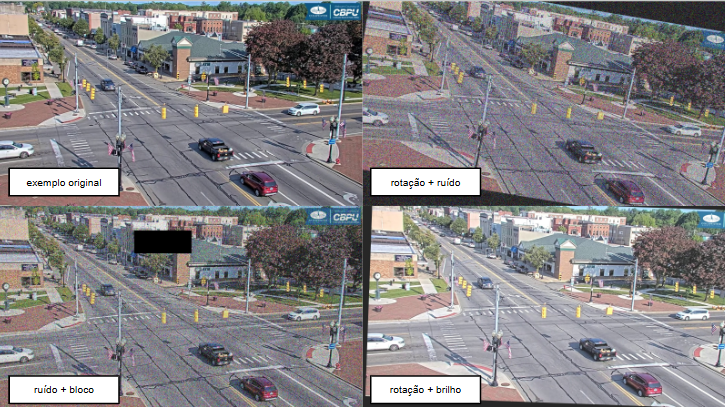

### Juntando com as imagens originais e separando em treino e validação

In [9]:
def combine_and_split_data(split_ratio=0.8):

        # Caminho das pastas de dados originais
    original_images_folder = 'imagens_p_treino/'  # Imagens originais
    original_labels_unified_folder = 'imagens_p_treino/unified_labels/'  # Rótulos unificados

    # Caminho das pastas de dados aumentados
    augmented_images_folder = 'MeuProjetoCarros/augmented_images/'  # Imagens aumentadas
    augmented_labels_folder = 'MeuProjetoCarros/augmented_labels/'  # Rótulos aumentados

    # Onde o dataset final (treino/validação) será salvo
    final_dataset_images_base = 'MeuProjetoCarros/dataset_para_treino/images/'
    final_dataset_labels_base = 'MeuProjetoCarros/dataset_para_treino/labels/'

    # Criar pastas temporárias para o dataset combinado
    combined_images_temp = os.path.join(final_dataset_images_base, 'combined_images')
    combined_labels_temp = os.path.join(final_dataset_labels_base, 'combined_labels')
    os.makedirs(combined_images_temp, exist_ok=True)  # Cria a pasta se não existir
    os.makedirs(combined_labels_temp, exist_ok=True)

    # Copiar imagens e rótulos originais para a pasta temporária
    for filename in os.listdir(original_images_folder):
        if filename.lower().endswith(('.jpg', '.jpeg', '.png')):  # Verifica se é uma imagem
            base_name = os.path.splitext(filename)[0]
            img_src_path = os.path.join(original_images_folder, filename)
            label_src_path = os.path.join(original_labels_unified_folder, base_name + '.txt')

            # Copiar a imagem para a pasta temporária
            shutil.copy(img_src_path, combined_images_temp)

            # Copiar o rótulo (se existir) para a pasta temporária
            if os.path.exists(label_src_path):
                shutil.copy(label_src_path, os.path.join(combined_labels_temp, base_name + '.txt'))
            else:
                # Se não houver rótulo, cria um arquivo de rótulo vazio
                open(os.path.join(combined_labels_temp, base_name + '.txt'), 'w').close()

    # Copiar imagens e rótulos aumentados para a pasta temporária
    for filename in os.listdir(augmented_images_folder):
        if filename.lower().endswith(('.jpg', '.jpeg', '.png')):  # Verifica se é uma imagem
            base_name = os.path.splitext(filename)[0]
            img_src_path = os.path.join(augmented_images_folder, filename)
            label_src_path = os.path.join(augmented_labels_folder, base_name + '.txt')

            # Copiar a imagem aumentada para a pasta temporária
            shutil.copy(img_src_path, combined_images_temp)

            # Copiar o rótulo aumentada (se existir) para a pasta temporária
            if os.path.exists(label_src_path):
                shutil.copy(label_src_path, os.path.join(combined_labels_temp, base_name + '.txt'))
            else:
                # Se não houver rótulo, cria um arquivo de rótulo vazio
                open(os.path.join(combined_labels_temp, base_name + '.txt'), 'w').close()

    # Criar pastas para treino e validação
    train_img_folder = os.path.join(final_dataset_images_base, 'train')
    val_img_folder = os.path.join(final_dataset_images_base, 'val')
    train_label_folder = os.path.join(final_dataset_labels_base, 'train')
    val_label_folder = os.path.join(final_dataset_labels_base, 'val')

    os.makedirs(train_img_folder, exist_ok=True)
    os.makedirs(val_img_folder, exist_ok=True)
    os.makedirs(train_label_folder, exist_ok=True)
    os.makedirs(val_label_folder, exist_ok=True)

    # 1. Agrupar por nome base
    image_files = [f for f in os.listdir(combined_images_temp) if f.endswith('.jpg')]
    base_names = set(f.split('_aug')[0] if '_aug' in f else os.path.splitext(f)[0] for f in image_files)
    base_names = list(base_names)
    random.shuffle(base_names)

    # 2. Split pelos nomes-base
    num_train = int(len(base_names) * split_ratio)
    train_bases = set(base_names[:num_train])
    val_bases = set(base_names[num_train:])

    print(f"Total de frames base: {len(base_names)}")
    print(f"Bases para treino: {len(train_bases)}")
    print(f"Bases para validação: {len(val_bases)}")

    # 3. Associar imagens e labels de acordo com o base name
    for img_filename in image_files:
        base_name = img_filename.split('_aug')[0] if '_aug' in img_filename else os.path.splitext(img_filename)[0]
        label_filename = os.path.splitext(img_filename)[0] + '.txt'

        if base_name in train_bases:
            shutil.copy(os.path.join(combined_images_temp, img_filename), os.path.join(train_img_folder, img_filename))
            shutil.copy(os.path.join(combined_labels_temp, label_filename), os.path.join(train_label_folder, label_filename))
        elif base_name in val_bases:
            shutil.copy(os.path.join(combined_images_temp, img_filename), os.path.join(val_img_folder, img_filename))
            shutil.copy(os.path.join(combined_labels_temp, label_filename), os.path.join(val_label_folder, label_filename))

    print("Split finalizado com segurança sem vazamento de dados.")


# Combine e divida os dados
#combine_and_split_data()

In [10]:
# Conteúdo do arquivo .yaml
yaml_content = """
# automovel_dataset.yaml
# Caminho base para o dataset
path: MeuProjetoCarros/dataset_para_treino/

# Caminhos relativos para os conjuntos de treino e validação
train: images/train
val: images/val

# Número de classes (automovel)
nc: 1

# Nomes das classes, na ordem dos IDs (começando do 0)
names: ['automovel']
"""

output_yaml_path = 'MeuProjetoCarros/automovel_dataset.yaml'

# Salvar o conteúdo no arquivo
#with open(output_yaml_path, 'w') as f:
    #f.write(yaml_content)

## Mapa de movimento

### Cálculo background

In [17]:
video_path = 'sample5.mp4'
background_path = 'background.png'

In [20]:
def gerar_background_por_moda(
    video_path,
    output_path,
    frame_interval_seconds=3,
    quantization=8,
    max_minutes=5,
    resize_shape=(640, 360)):

    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)
    frame_interval = int(fps * frame_interval_seconds)
    max_frames = int(fps * 60 * max_minutes)

    # Pega dimensões originais do vídeo
    ret, first_frame = cap.read()
    if not ret:
        cap.release()
        return
    original_height, original_width = first_frame.shape[:2]
    cap.set(cv2.CAP_PROP_POS_FRAMES, 0)

    frames = []
    frame_count = 0

    while frame_count < max_frames:
        ret, frame = cap.read()
        if not ret:
            break
        if frame_count % frame_interval == 0:
            frame_resized = cv2.resize(frame, resize_shape, interpolation=cv2.INTER_NEAREST)
            quant_frame = (frame_resized // quantization).astype(np.uint8)
            frames.append(quant_frame)
        frame_count += 1

    cap.release()

    frames = np.stack(frames, axis=0)
    N, H, W, C = frames.shape
    background_q = np.zeros((H, W, C), dtype=np.uint8)

    for c in range(C):
        for i in tqdm(range(H), desc=f"Canal {c}"):
            for j in range(W):
                pixel_vals = frames[:, i, j, c]
                background_q[i, j, c] = np.bincount(pixel_vals).argmax()

    background = (background_q * quantization).astype(np.uint8)

    # Redimensiona de volta para a dimensão original
    background_resized = cv2.resize(background, (original_width, original_height), interpolation=cv2.INTER_NEAREST)

    cv2.imwrite(output_path, background_resized)


In [21]:
gerar_background_por_moda(video_path, background_path)

Canal 2: 100%|██████████| 360/360 [00:00<00:00, 667.55it/s]


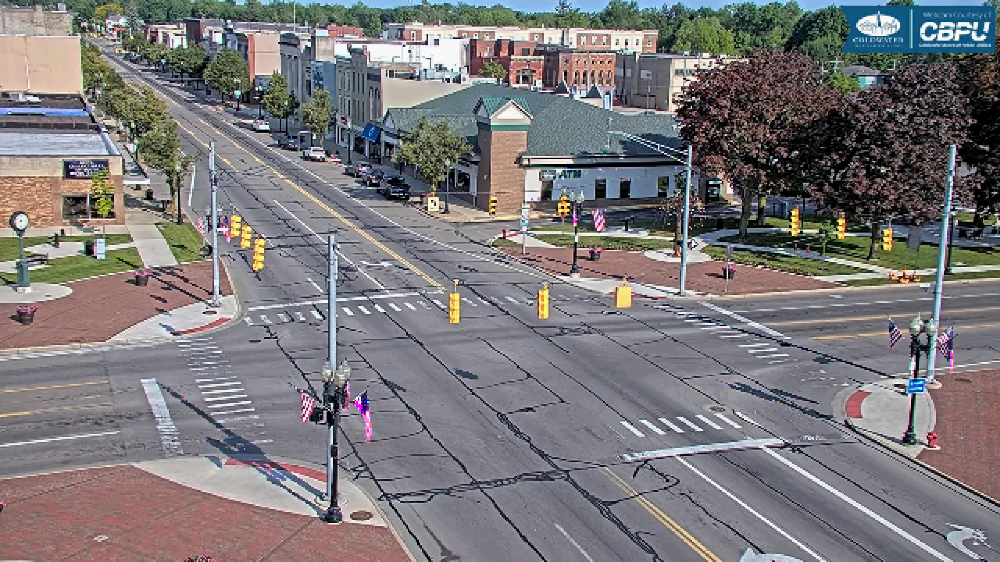

### Ler todas as imagens de treino e subtrair o background

In [28]:
## ETAPA 2

## Modelagem

In [ ]:
from ultralytics import YOLO

# Localização do arquivo .yaml que contém as informações dos nossos dados
data_yaml_path = 'MeuProjetoCarros/automovel_dataset.yaml'

model = YOLO('yolov8n.pt')

results = model.train(data=data_yaml_path,
                      epochs=1, # Exemplo
                      imgsz=640,
                      batch=16,
                      name='meu_modelo_automovel_v1',
                      device='cpu') # Usar a GPU

source_run_folder = 'runs/detect/meu_modelo_automovel_v1/' 
#destination_drive_folder = 'MeuProjetoCarros/treinamentos_yolov8/meu_modelo_automovel_v1/' # modelo salvo

#os.makedirs(destination_drive_folder, exist_ok=True)

try:
    #shutil.copytree(source_run_folder, destination_drive_folder, dirs_exist_ok=True)
    print("Resultados copiados com sucesso!")
except Exception as e:
    print(f"Erro ao copiar resultados")

Ultralytics 8.3.159  Python-3.13.1 torch-2.7.0+cpu CPU (Intel Core(TM) i5-8265U 1.60GHz)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=MeuProjetoCarros/automovel_dataset.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=1, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=meu_modelo_automovel_v15, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0,

100%|██████████| 755k/755k [00:00<00:00, 12.1MB/s]

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

 19                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
 20             [-1, 9]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 21                  -1  1    493056  ultralytics.nn.modules.block.C2f             [384, 256, 1]                 
 22        [15, 18, 21]  1    751507  ultralytics.nn.modules.head.Detect           [1, [64, 128, 256]]           
Model summary: 129 layers, 3,011,043 parameters, 3,011,027 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
train: Fast image access  (ping: 0.20.1 ms, read: 563.332.1 MB/s, size: 888.9 KB)


train: Scanning C:\Users\Usuário\Desktop\ENTREGA FINAL\MeuProjetoCarros\dataset_para_treino\labels\train... 235 images, 15 backgrounds, 0 corrupt: 100%|██████████| 250/250 [00:00<00:00, 1620.17it/s]

train: New cache created: C:\Users\Usurio\Desktop\ENTREGA FINAL\MeuProjetoCarros\dataset_para_treino\labels\train.cache


val: Fast image access  (ping: 0.20.1 ms, read: 512.886.4 MB/s, size: 845.0 KB)


C:\Users\Usuário\AppData\Roaming\Python\Python313\site-packages\torch\utils\data\dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
val: Scanning C:\Users\Usuário\Desktop\ENTREGA FINAL\MeuProjetoCarros\dataset_para_treino\labels\val... 391 images, 390 backgrounds, 0 corrupt: 100%|██████████| 640/640 [00:00<00:00, 2756.64it/s]


val: New cache created: C:\Users\Usurio\Desktop\ENTREGA FINAL\MeuProjetoCarros\dataset_para_treino\labels\val.cache


C:\Users\Usuário\AppData\Roaming\Python\Python313\site-packages\torch\utils\data\dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Plotting labels to runs\detect\meu_modelo_automovel_v15\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\meu_modelo_automovel_v15
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/1         0G      1.625      2.705      1.119        204        640: 100%|██████████| 16/16 [02:52<00:00, 10.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:49<00:00,  5.49s/it]


                   all        640       2654     0.0108      0.783      0.175      0.073

1 epochs completed in 0.079 hours.
Optimizer stripped from runs\detect\meu_modelo_automovel_v15\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\meu_modelo_automovel_v15\weights\best.pt, 6.2MB

Validating runs\detect\meu_modelo_automovel_v15\weights\best.pt...
Ultralytics 8.3.159  Python-3.13.1 torch-2.7.0+cpu CPU (Intel Core(TM) i5-8265U 1.60GHz)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [01:27<00:00,  4.39s/it]


                   all        640       2654     0.0108      0.783      0.175      0.073
Speed: 2.1ms preprocess, 86.0ms inference, 0.0ms loss, 23.9ms postprocess per image
Results saved to runs\detect\meu_modelo_automovel_v15
Resultados copiados com sucesso para o Google Drive!


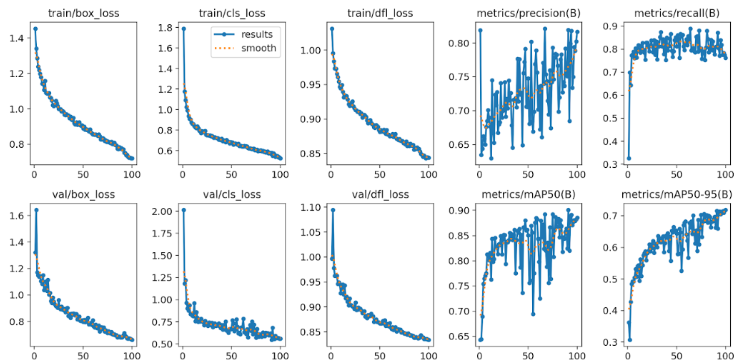

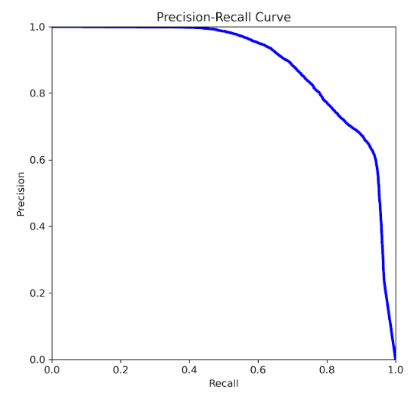